## PARTE 1:  Pure denoising vs Denoised deconvolution

Part 1): Pure denoising vs Denoised deconvolution
In the notebook of the previous experience, use the regularized reconstruction without the
deconvolution part (while using the same data that are corrupted by a PSF).
Compare how, at identical 𝛽 strength, the edge appearance change.

Concept: What changes?

To switch from Denoised Deconvolution to Pure Denoising, we simply change the operator A:

Deconvolution: A is the PSF (Gaussian Blur). The algorithm tries to invert the blur while smoothing noise.

Pure Denoising: A is the Identity Matrix (meaning A(x)=x). The algorithm treats the input image as is and only tries to remove noise (smoothing), effectively ignoring the fact that the image is also blurred.

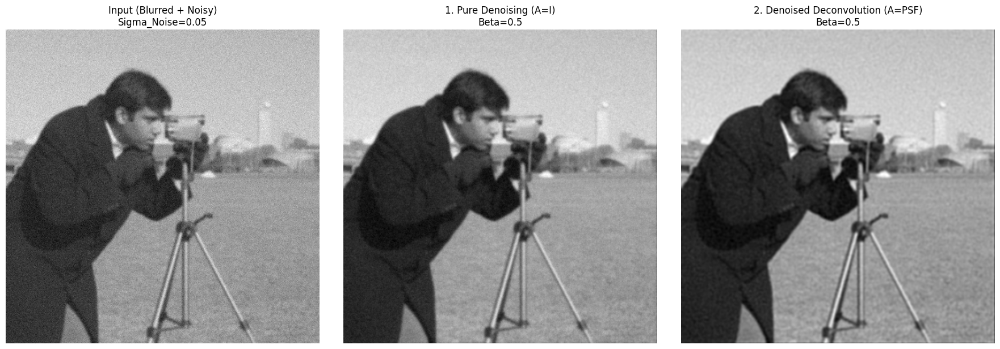

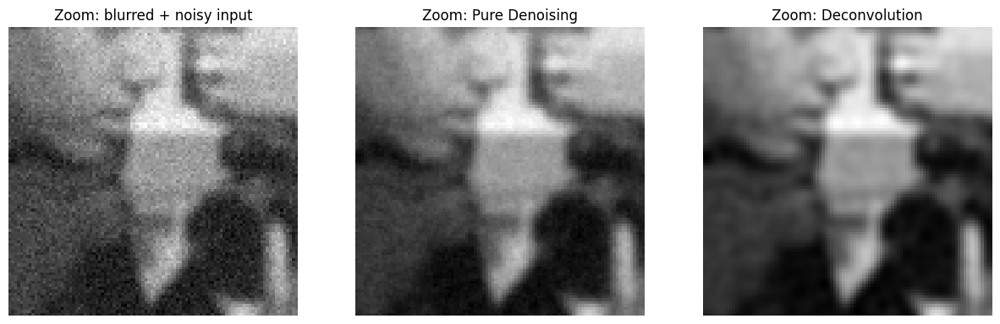

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from skimage import data

# --- Setup Data ---
original_image = data.camera().astype(float) / 255.0

def create_psf(shape, sigma):
    impulse = np.zeros(shape)
    center = (shape[0]//2, shape[1]//2)
    impulse[center] = 1.0
    return ndimage.gaussian_filter(impulse, sigma=sigma)

# 1. Create Degradation (Blur + Noise)
SIGMA_PSF = 1.5
blurred_image = ndimage.gaussian_filter(original_image, sigma=SIGMA_PSF)

SIGMA_NOISE = 0.05
noisy_input = blurred_image + np.random.normal(0, SIGMA_NOISE, blurred_image.shape)

# --- The Solver Class ---
class FlexibleSolver:
    def __init__(self, psf_sigma, mode='deconvolution'):
        self.sigma = psf_sigma
        self.mode = mode 

    def A(self, x):
        if self.mode == 'denoise':
            return x 
        else:
            return ndimage.gaussian_filter(x, sigma=self.sigma) 

    def AT(self, x):
        if self.mode == 'denoise':
            return x 
        else:
            return ndimage.gaussian_filter(x, sigma=self.sigma) 
        
    def compute_laplacian(self, x):
        gx = np.diff(x, axis=0, append=0) 
        gy = np.diff(x, axis=1, append=0)
        dg_x = np.diff(gx, axis=0, prepend=0)
        dg_y = np.diff(gy, axis=1, prepend=0)
        return dg_x + dg_y
    
    def compute_alpha(self, g, beta):
        num = np.sum(g * g)
        Ag = self.A(g)
        AtAg = self.AT(Ag)
        
        if beta > 0:
            Lap_g = self.compute_laplacian(g)
            Hg = AtAg - beta * Lap_g
        else:
            Hg = AtAg
            
        denom = np.sum(g * Hg)
        if denom < 1e-10: return 0.0
        return num / denom

    def solve(self, y, beta=0.0, iterations=50, verbose=False):
        x = np.zeros_like(y)
        history = []
        
        for i in range(iterations):
            Ax = self.A(x)
            residual = y - Ax
            g_data = self.AT(residual)
            
            if beta > 0:
                g_reg = self.compute_laplacian(x)
            else:
                g_reg = 0
            
            g_total = g_data + beta * g_reg
            alpha = self.compute_alpha(g_total, beta)
            x = x + alpha * g_total
            history.append(np.linalg.norm(alpha * g_total))
            
        return x

# --- Comparison Execution ---
BETA_VAL = 0.5
ITERS = 50 # Ridotto a 50 per velocità, puoi rimettere 100

# 1. Run Pure Denoising
solver_denoise = FlexibleSolver(psf_sigma=SIGMA_PSF, mode='denoise')
res_denoise = solver_denoise.solve(noisy_input, beta=BETA_VAL, iterations=ITERS)

# 2. Run Denoised Deconvolution
solver_deconv = FlexibleSolver(psf_sigma=SIGMA_PSF, mode='deconvolution')
res_deconv = solver_deconv.solve(noisy_input, beta=BETA_VAL, iterations=ITERS)

# --- Visualization Corretta ---
plt.figure(figsize=(18, 6))

# Input
plt.subplot(1, 3, 1)
plt.imshow(noisy_input, cmap='gray')
plt.title(f"Input (Blurred + Noisy)\nSigma_Noise={SIGMA_NOISE}")
plt.axis('off')

# Pure Denoising Result
plt.subplot(1, 3, 2)
plt.imshow(res_denoise, cmap='gray')
plt.title(f"1. Pure Denoising (A=I)\nBeta={BETA_VAL}")
plt.axis('off')

# Deconvolution Result
plt.subplot(1, 3, 3)
plt.imshow(res_deconv, cmap='gray')
plt.title(f"2. Denoised Deconvolution (A=PSF)\nBeta={BETA_VAL}")
plt.axis('off')

plt.tight_layout()
plt.show()

# Optional: Zoom
plt.figure(figsize=(15, 5)) # Allargata leggermente per farci stare 3 plot

# subplot separati
zoom_slice = (slice(150, 250), slice(200, 300)) 

plt.subplot(1, 3, 1)
plt.imshow(noisy_input[zoom_slice], cmap='gray')
plt.title("Zoom: blurred + noisy input")
plt.axis('off')

plt.subplot(1, 3, 2) 
plt.imshow(res_denoise[zoom_slice], cmap='gray')
plt.title("Zoom: Pure Denoising")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(res_deconv[zoom_slice], cmap='gray')
plt.title("Zoom: Deconvolution")
plt.axis('off')

plt.show()

 
OSS:
Con alcuni bet ad esempio alti (b=1) pure denosiing e deconvolution sono simili (legg meglio pure denoising). Con beta bassi pure denoising è molto migliore di deconvolution ma ee intristinguibile dalla immagine di input (blurred+ noisy input) 

Interpretation of Results

When you run this comparison, observe the edges (e.g., the cameraman's coat or the camera structure):

Pure Denoising Result:

The image looks clean but still blurry.

Since A=I, the algorithm assumes the "perfect" image should look exactly like the input data (which is blurred). It only smoothes out the Gaussian noise. It does not recover the high frequencies lost to the PSF.

Edge Appearance: Soft, rounded edges.

Denoised Deconvolution Result:

The image looks sharper.

Since A=PSF, the algorithm knows the data was blurred. It tries to find an image x that, when re-blurred, matches the data. This allows it to sharpen the edges.

Edge Appearance: Steeper gradients (crisper edges), though you might see slight "ringing" or noise artifacts near the edges depending on how high β is.

## Confronto tra Pure Denoising e Denoised Deconvolution

| **Aspetto** | **Pure Denoising (A = I)** | **Denoised Deconvolution (A = PSF)** |
|-------------|----------------------------|--------------------------------------|
| **Operatore A** | Identità | Convoluzione con PSF (blur gaussiano) |
| **Modello Assunto** | y = x + n | y = Ax + n |
| **Obiettivo** | min ‖x − y‖² + β‖∇x‖² | min ‖Ax − y‖² + β‖∇x‖² |
| **Interpretazione** | L'immagine reale coincide con il dato rumoroso | Il dato è una versione sfocata dell'immagine reale |
| **Nitidezza dei Bordi** | Bassa — bordi morbidi e arrotondati | Alta — bordi più ripidi e definiti |
| **Recupero delle Alte Frequenze** | Assente | Parziale (dipende da β) |
| **Comportamento sul Rumore** | Forte soppressione | Possibile amplificazione |
| **Artefatti Tipici** | Oversmoothing, perdita di texture | molto probabili: Ringing, grana, pitting |
| **Sensibilità al parametro β** | Moderata | Elevata (trade-off critico) |
| **Stabilità Numerica** | Alta | Più instabile (problema mal posto) |

---

### Sintesi Visiva Attesa

- **Pure Denoising** → immagine più pulita ma ancora sfocata.
- **Deconvolution** → immagine più nitida ma potenzialmente più rumorosa.

La differenza è più evidente osservando i bordi e le texture fini.


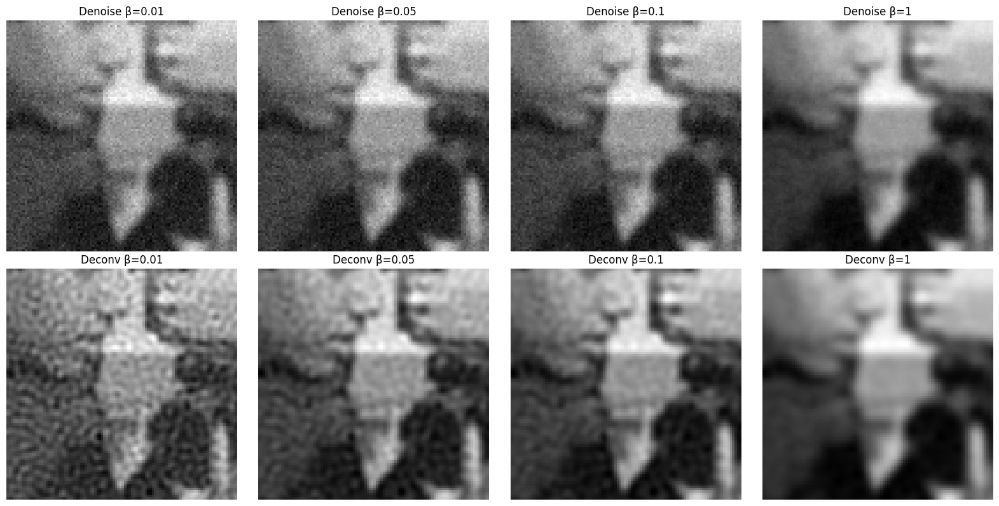

In [2]:
# --- Parametri ---
BETA_LIST = [0.01, 0.05, 0.1, 1]  # valori di beta da confrontare
ITERS = 100

# Definisci la regione di zoom (crop)
zoom_slice = (slice(150, 250), slice(200, 300))  # puoi cambiare per la tua area di interesse

# Prepara la figura
fig, axes = plt.subplots(2, len(BETA_LIST), figsize=(4*len(BETA_LIST), 8))

for col, beta in enumerate(BETA_LIST):
    # --- Pure Denoising ---
    solver_denoise = FlexibleSolver(psf_sigma=SIGMA_PSF, mode='denoise')
    res_denoise = solver_denoise.solve(noisy_input, beta=beta, iterations=ITERS)
    
    # --- Deconvolution ---
    solver_deconv = FlexibleSolver(psf_sigma=SIGMA_PSF, mode='deconvolution')
    res_deconv = solver_deconv.solve(noisy_input, beta=beta, iterations=ITERS)
    
    # --- Crop per zoom ---
    crop_denoise = res_denoise[zoom_slice]
    crop_deconv = res_deconv[zoom_slice]
    
    # --- Plotting ---
    # Top row: Pure Denoising
    ax = axes[0, col]
    ax.imshow(crop_denoise, cmap='gray')
    ax.set_title(f"Denoise β={beta}")
    ax.axis('off')
    
    # Bottom row: Deconvolution
    ax = axes[1, col]
    ax.imshow(crop_deconv, cmap='gray')
    ax.set_title(f"Deconv β={beta}")
    ax.axis('off')

plt.tight_layout()
plt.show()


## PARTE 2: Apply advanced algorithms to your data

Esperimenti di Denoising e Deconvolution con scikit-image APPLICATE A IMMAGINI OTTENUTE


Se disponi di immagini acquisite (ad esempio con un microscopio Olympus), puoi sperimentare diverse tecniche di **denoising e deconvolution** e confrontarle qualitativamente.

---

## Algoritmi principali disponibili

### 1. Wiener Filter
- Funzione: `skimage.restoration.wiener`
- Scopo: deconvolution con regolarizzazione
- Input richiesti:
  - immagine
  - PSF (Point Spread Function)
  - forza della regolarizzazione
- Note:
  - Devi conoscere la PSF
  - La regolarizzazione aiuta a limitare il rumore amplificato dalla deconvolution

---

### 2. Richardson-Lucy
- Funzione: `skimage.restoration.richardson_lucy`
- Scopo: deconvolution senza regolarizzazione
- Assunzioni:
  - Rumore di tipo Poisson
- Limitazioni:
  - Nessuna regolarizzazione → controlla il rumore limitando il numero di iterazioni

---

### 3. Denoising TV (Total Variation)
- Funzione: `skimage.restoration.denoise_tv_chambolle`
- Scopo: denoising puro
- Caratteristiche:
  - Minimizza la variazione totale → immagini più lisce
  - Non esegue deconvolution
  - Buono per rimuovere rumore preservando i bordi

---

### 4. Denoising Wavelet
- Funzione: `skimage.restoration.denoise_wavelet`
- Scopo: denoising puro usando trasformata wavelet
- Caratteristiche:
  - Sparsity-inducing → preserva dettagli fini
  - Spesso molto efficace per immagini naturali e microscopiche
  - Non esegue deconvolution

---

## Suggerimenti pratici

1. **Confronto qualitativo**: osserva bordi, texture e rumore residuo.
2. **Sperimenta più valori di parametri** (numero iterazioni, regolarizzazione, threshold wavelet).
3. **Combina algoritmi**: ad esempio, prima deconvolution (Wiener o Richardson-Lucy) e poi denoise TV o wavelet.
4. **Visualizza sempre lo zoom sui dettagli** p


In [3]:
import sys
print(sys.executable)
!{sys.executable} -m pip install PyWavelets --upgrade
import pywt
print("PyWavelets versione:", pywt.__version__)

/Library/Developer/CommandLineTools/usr/bin/python3
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip
PyWavelets versione: 1.6.0


Applicazione algoritmi avanzati in corso...


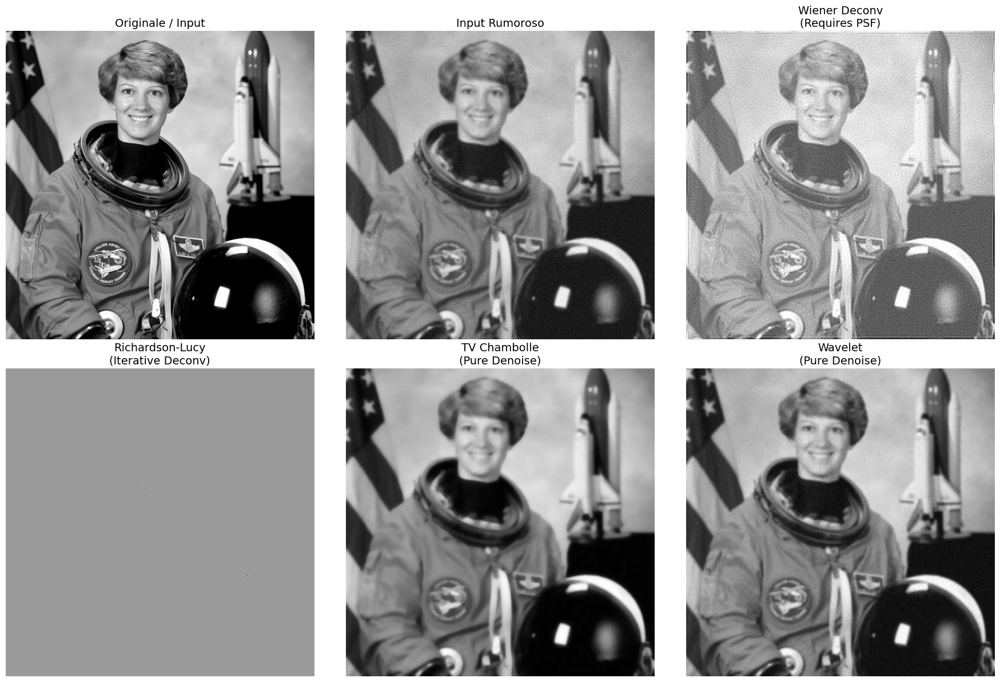

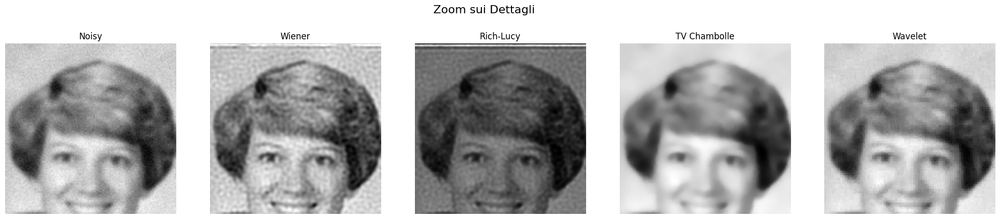

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from skimage import data, color, restoration, img_as_float
from skimage import io  # Serve se vuoi caricare le tue immagini Olympus

# --- 1. PREPARAZIONE DATI (O CARICAMENTO TUE IMMAGINI) ---

# A) Se usi l'immagine di esempio:
img = color.rgb2gray(data.astronaut())  # Convertiamo in scala di grigi
img = img_as_float(img)

# B) Se vuoi caricare la tua immagine Olympus (decommenta sotto):
# img = io.imread('nome_tua_immagine.tif', as_gray=True)
# img = img_as_float(img)

# Creiamo una PSF (Point Spread Function) nota per la simulazione
psf_sigma = 1.5 
psf_size = 15
psf = np.zeros((psf_size, psf_size))
psf[psf_size//2, psf_size//2] = 1
psf = ndimage.gaussian_filter(psf, sigma=psf_sigma)

# Simuliamo il degrado (Sfocatura + Rumore)
blurred_img = ndimage.convolve(img, psf, mode='reflect')
noisy_img = blurred_img + 0.1 * blurred_img.std() * np.random.randn(*blurred_img.shape)

print("Applicazione algoritmi avanzati in corso...")

# --- 2. APPLICAZIONE ALGORITMI ---

# A. WIENER FILTER (Deconvoluzione con Regolarizzazione)
deconv_wiener = restoration.wiener(noisy_img, psf, balance=0.01)

# B. RICHARDSON-LUCY (Deconvoluzione Iterativa)
deconv_rl = restoration.richardson_lucy(noisy_img, psf, num_iter=30, clip=False)

# C. TV CHAMBOLLE (Pure Denoising - Total Variation)
denoise_tv = restoration.denoise_tv_chambolle(noisy_img, weight=0.1)

# D. WAVELET DENOISING (Pure Denoising - Trasformata Wavelet)
# ✅ Usa channel_axis=None per immagini in scala di grigi
denoise_wave = restoration.denoise_wavelet(noisy_img, rescale_sigma=True, channel_axis=None)

# --- 3. CONFRONTO VISIVO ---

titles = [
    'Originale / Input', 'Input Rumoroso',
    'Wiener Deconv\n(Requires PSF)', 'Richardson-Lucy\n(Iterative Deconv)',
    'TV Chambolle\n(Pure Denoise)', 'Wavelet\n(Pure Denoise)'
]
images = [img, noisy_img, deconv_wiener, deconv_rl, denoise_tv, denoise_wave]

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
ax = axes.ravel()

for i in range(len(images)):
    ax[i].imshow(images[i], cmap='gray')
    ax[i].set_title(titles[i], fontsize=14)
    ax[i].axis('off')

plt.tight_layout()
plt.show()

# --- 4. ZOOM SUI DETTAGLI ---

# Adatta le coordinate in base alla tua immagine
zoom_slice = (slice(0, 150), slice(150, 300))

zoom_imgs = [noisy_img, deconv_wiener, deconv_rl, denoise_tv, denoise_wave]
zoom_titles = ['Noisy', 'Wiener', 'Rich-Lucy', 'TV Chambolle', 'Wavelet']

fig_zoom, axes_zoom = plt.subplots(1, 5, figsize=(25, 5))

for i in range(len(zoom_imgs)):
    axes_zoom[i].imshow(zoom_imgs[i][zoom_slice], cmap='gray')
    axes_zoom[i].set_title(zoom_titles[i])
    axes_zoom[i].axis('off')

plt.suptitle("Zoom sui Dettagli", fontsize=16)
plt.show()


# Esperimenti di Denoising e Deconvolution con scikit-image

Se disponi di immagini acquisite (ad esempio con un microscopio Olympus), puoi sperimentare diverse tecniche di **denoising e deconvolution** e confrontarle qualitativamente.

---

## Algoritmi principali disponibili

### 1. Wiener Filter
- Funzione: `skimage.restoration.wiener`
- Scopo: deconvolution con regolarizzazione
- Input richiesti:
  - immagine
  - PSF (Point Spread Function)
  - forza della regolarizzazione
- Note:
  - Devi conoscere la PSF
  - La regolarizzazione aiuta a limitare il rumore amplificato dalla deconvolution

---

### 2. Richardson-Lucy
- Funzione: `skimage.restoration.richardson_lucy`
- Scopo: deconvolution senza regolarizzazione
- Assunzioni:
  - Rumore di tipo Poisson
- Limitazioni:
  - Nessuna regolarizzazione → controlla il rumore limitando il numero di iterazioni

---

### 3. Denoising TV (Total Variation)
- Funzione: `skimage.restoration.denoise_tv_chambolle`
- Scopo: denoising puro
- Caratteristiche:
  - Minimizza la variazione totale → immagini più lisce
  - Non esegue deconvolution
  - Buono per rimuovere rumore preservando i bordi

---

### 4. Denoising Wavelet
- Funzione: `skimage.restoration.denoise_wavelet`
- Scopo: denoising puro usando trasformata wavelet
- Caratteristiche:
  - Sparsity-inducing → preserva dettagli fini
  - Spesso molto efficace per immagini naturali e microscopiche
  - Non esegue deconvolution

---

## Suggerimenti pratici

1. **Confronto qualitativo**: osserva bordi, texture e rumore residuo.
2. **Sperimenta più valori di parametri** (numero iterazioni, regolarizzazione, threshold wavelet).
3. **Combina algoritmi**: ad esempio, prima deconvolution (Wiener o Richardson-Lucy) e poi denoise TV o wavelet.
4. **Visualizza sempre lo zoom sui dettagli** per valutare nitidezza e artefatti.

---

> Nota: leggere bene la documentazione di ciascun metodo ti permette di scegliere i parametri corretti e capire le assunzioni di rumore e modello.


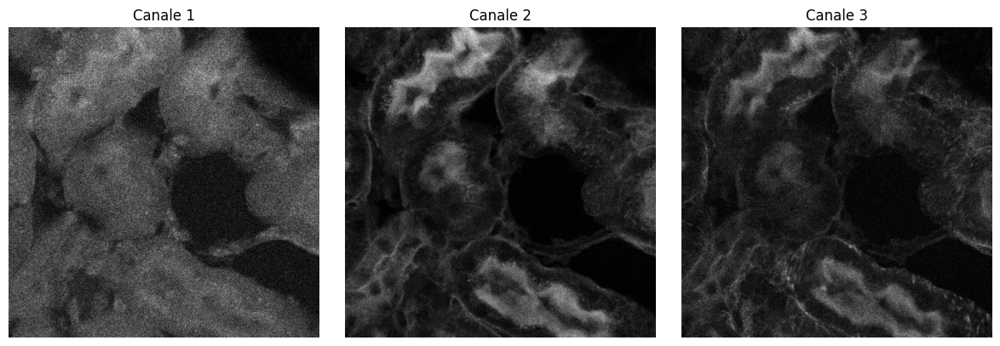

In [5]:
import os
from skimage import io
import matplotlib.pyplot as plt

# --- NOTA: Ho aggiunto lo spazio dopo "Repositories " nel percorso ---
base_path = r'/Users/francesco/Repositories /noise_images/Immagini_donoises'

paths = [
    os.path.join(base_path, '150mic_10ripetizioni_50mW_512px_770nm_Ch1.tif'),
    os.path.join(base_path, '150mic_10ripetizioni_50mW_512px_770nm_Ch2.tif'),
    os.path.join(base_path, '150mic_10ripetizioni_50mW_512px_770nm_Ch3.tif')
]



# --- Caricamento e Visualizzazione ---
try:
    images = [io.imread(p).astype(float) / 255.0 for p in paths]

    plt.figure(figsize=(12, 4))
    for i, im in enumerate(images):
        plt.subplot(1, 3, i + 1)
        plt.imshow(im, cmap='gray')
        plt.title(f"Canale {i + 1}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()
 
except FileNotFoundError:
    print("Ci sono ancora errori nel percorso. Controlla se anche 'noise_images' ha degli spazi.")

Inizio elaborazione su 3 immagini...

--- Elaborazione File 1: 150mic_10ripetizioni_50mW_512px_770nm_Ch1.tif ---


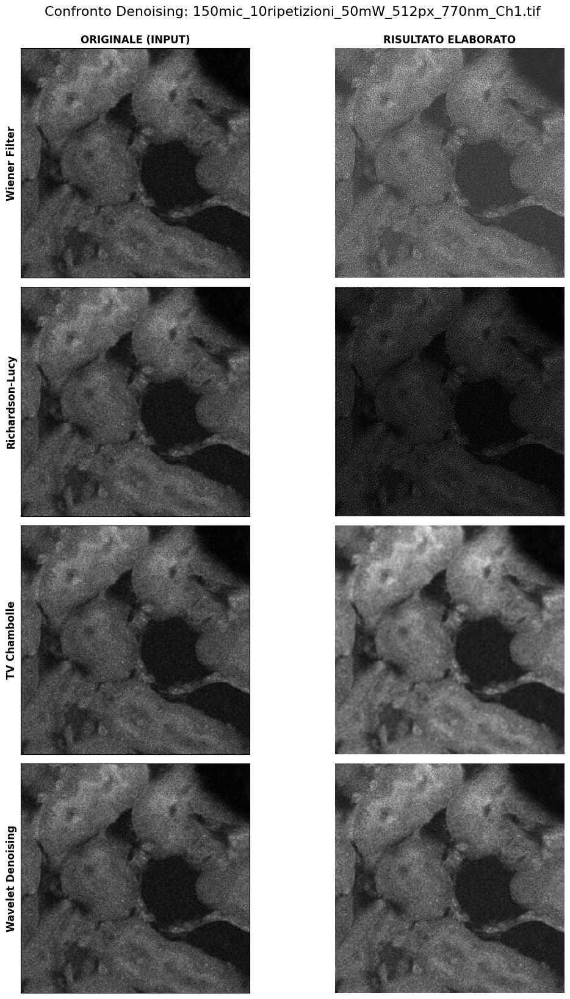

Grafico generato per 150mic_10ripetizioni_50mW_512px_770nm_Ch1.tif.

--- Elaborazione File 2: 150mic_10ripetizioni_50mW_512px_770nm_Ch2.tif ---


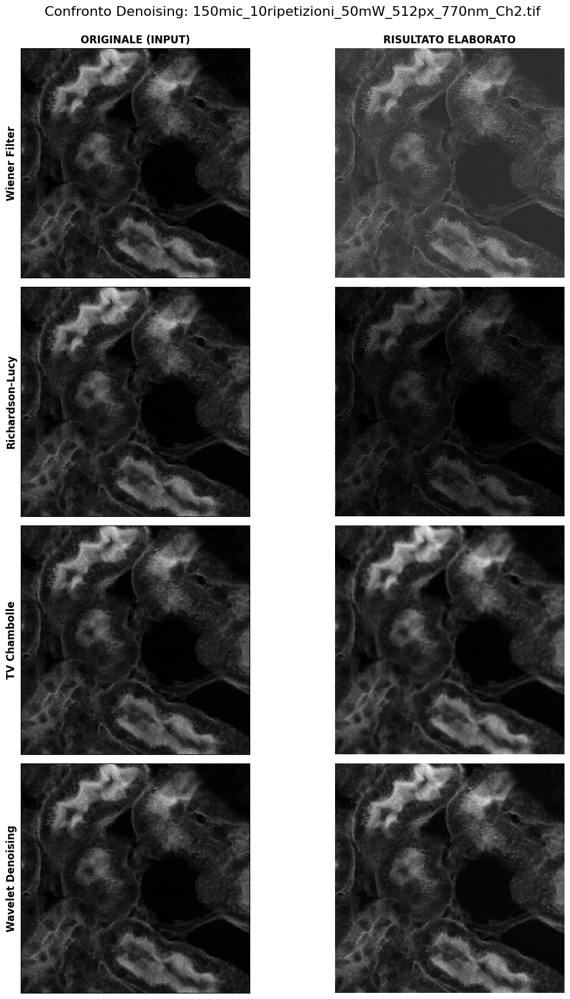

Grafico generato per 150mic_10ripetizioni_50mW_512px_770nm_Ch2.tif.

--- Elaborazione File 3: 150mic_10ripetizioni_50mW_512px_770nm_Ch3.tif ---


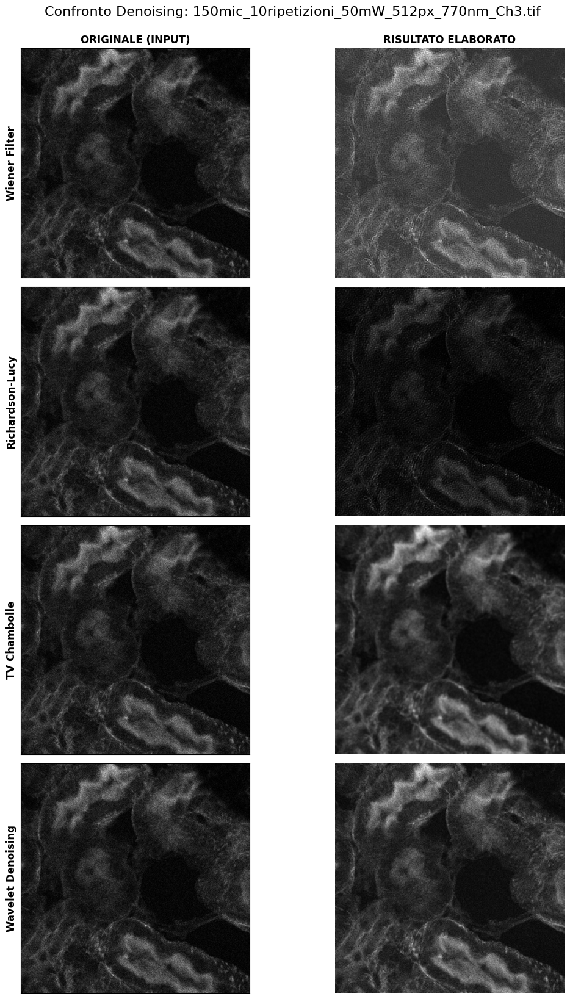

Grafico generato per 150mic_10ripetizioni_50mW_512px_770nm_Ch3.tif.



In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from skimage import io, restoration, img_as_float, color


# --- 1. PREPARAZIONE PSF (Per Deconvoluzione) ---
psf_sigma = 1.1160
psf_size = int(1.116 * 6)
psf = np.zeros((psf_size, psf_size))
psf[psf_size//2, psf_size//2] = 1
psf = ndimage.gaussian_filter(psf, sigma=psf_sigma)

# --- 2. ELABORAZIONE E CONFRONTO ---

try:
    for p in paths:
        if not os.path.exists(p):
            raise FileNotFoundError(f"File non trovato: {p}")

    print(f"Inizio elaborazione su {len(paths)} immagini...\n")

    for idx, filepath in enumerate(paths):
        filename = os.path.basename(filepath)
        print(f"--- Elaborazione File {idx + 1}: {filename} ---")
        
        # Caricamento
        img_raw = io.imread(filepath)
        noisy_img = img_as_float(img_raw)

        if noisy_img.ndim == 3:
            noisy_img = color.rgb2gray(noisy_img)

        # Applicazione Algoritmi
        res_wiener = restoration.wiener(noisy_img, psf, balance=0.01)
        res_rl = restoration.richardson_lucy(noisy_img, psf, num_iter=10, clip=False)
        #res_tv = restoration.denoise_tv_chambolle(noisy_img, weight=0.1)
        #res_wave = restoration.denoise_wavelet(noisy_img, rescale_sigma=True, method='BayesShrink',channel_axis=None)
        
      # --- MODIFICA WAVELET AVANZATA ---
        # 1. Stimiamo quanto rumore c'è nell'immagine
        sigma_est = restoration.estimate_sigma(noisy_img, average_sigmas=True)
        
        # 2. Impostiamo la "Forza" (1.0 = Standard. Aumenta a 1.5 o 2.0 per pulire di più)
        wavelet_strength = 1.5 
        
        # 3. Applicazione (Usa 'coif5' invece di 'db1' per evitare l'effetto pixelato)
        res_wave = restoration.denoise_wavelet(
            noisy_img, 
            sigma=sigma_est * wavelet_strength, 
            wavelet='coif5', #Consiglio: Usa 'db4', 'sym8', o 'coif5'.
            #Sono forme più morbide e curve, ideali per cellule e tessuti.
            mode='hard', 
            method='BayesShrink', 
            rescale_sigma=True, 
            channel_axis=None
        )
        
        # --- TOTAL VARIATION DENOISING OTTIMIZZATO ---
        # weight: Più è alto, più pulisce MA più "appiattisce" (effetto cartoon).
        #         Per biologia: 0.1 è alto. Usa 0.01 - 0.05 per dettagli fini.
        # eps:    Tolleranza. Abbassiamola per maggiore precisione sui segnali deboli.
        res_tv = restoration.denoise_tv_chambolle(
          noisy_img, 
          weight=0.03,       # CONSIGLIO: Scendi a 0.02-0.03 per non perdere texture interna
          eps=0.1,        # Più preciso del default (0.0002)
          max_num_iter=500,  # Aumentiamo le iterazioni per garantire la convergenza
        channel_axis=None
        )       

        # --- VISUALIZZAZIONE 2 COLONNE (PRIMA vs DOPO) ---
        
        # Lista di tuple: (Nome Algoritmo, Immagine Processata)
        algoritmi = [
            ("Wiener Filter", res_wiener),
            ("Richardson-Lucy", res_rl),
            ("TV Chambolle", res_tv),
            ("Wavelet Denoising", res_wave)
        ]

        # 4 Righe (una per algoritmo), 2 Colonne (Input vs Output)
        fig, axes = plt.subplots(4, 2, figsize=(12, 16))
        
        for row, (algo_name, res_img) in enumerate(algoritmi):
            
            # Colonna 1: Originale
            axes[row, 0].imshow(noisy_img, cmap='gray')
            if row == 0: axes[row, 0].set_title("ORIGINALE (INPUT)", fontweight='bold')
            axes[row, 0].set_ylabel(algo_name, fontsize=12, fontweight='bold') # Nome algo a sinistra
            
            # Rimuoviamo i tick ma lasciamo l'etichetta dell'asse Y per leggere il nome
            axes[row, 0].set_xticks([])
            axes[row, 0].set_yticks([])

            # Colonna 2: Risultato
            axes[row, 1].imshow(res_img, cmap='gray')
            if row == 0: axes[row, 1].set_title("RISULTATO ELABORATO", fontweight='bold')
            axes[row, 1].axis('off')

        plt.tight_layout()
        plt.suptitle(f"Confronto Denoising: {filename}", fontsize=16, y=1.02)
        plt.show()

        print(f"Grafico generato per {filename}.\n")

except FileNotFoundError as e:
    print(f"ERRORE: {e}")
except Exception as e:
    print(f"Errore imprevisto: {e}")

In [7]:
import re
# Se non hai 'tifffile', installalo con: pip install tifffile
try:
    import tifffile
except ImportError:
    print("Libreria 'tifffile' non trovata. Verrà usato il parsing del nome file.")
    tifffile = None

# --- 2.1 PARAMETRI FISICI MICROSCOPIO (DA IMPOSTARE) ---
# Questi valori dipendono dal tuo obiettivo e laser.
# Il nome del file dice "770nm", quindi assumiamo quella lunghezza d'onda.
WAVELENGTH_NM = 770.0  # Lambda (nm)
NUMERICAL_APERTURE = 0.5 # NA (Esempio: 20x air è ~0.5, 60x oil è ~1.4. CAMBIALO!)

def get_pixel_size_microns(filepath):
    """
    Tenta di estrarre la dimensione del pixel (in micron).
    Prima prova dai metadati TIF, poi dal nome del file (es: '150mic...512px').
    """
    px_size = None
    
    # METODO A: Metadati TIF (Richiede tifffile)
    if tifffile:
        try:
            with tifffile.TiffFile(filepath) as tif:
                # Cerca nei tag comuni di risoluzione (ResolutionUnit: 3 = cm, 2 = inch)
                tags = tif.pages[0].tags
                x_res = tags['XResolution'].value
                res_unit = tags['ResolutionUnit'].value if 'ResolutionUnit' in tags else None
                
                # Calcolo se unità nota (semplificato)
                if x_res and x_res[0] > 0:
                     # x_res è spesso una tupla (numeratore, denominatore)
                    val = x_res[0] / x_res[1]
                    if res_unit == 3: # cm
                        px_size = 10000 / val # cm -> um
                    elif res_unit == 2: # inch
                        px_size = 25400 / val # inch -> um
        except Exception:
            pass # Fallito lettura metadati

    # METODO B: Parsing Nome File (Specifico per i tuoi file "150mic...512px")
    # Questo è spesso più affidabile se i metadati non sono salvati correttamente
    if px_size is None:
        match_mic = re.search(r'(\d+)mic', filepath)
        match_px = re.search(r'(\d+)px', filepath)
        
        if match_mic and match_px:
            fov_microns = float(match_mic.group(1)) # es. 150
            pixels = float(match_px.group(1))       # es. 512
            px_size = fov_microns / pixels
            print(f"  -> Pixel size calcolato dal nome file: {px_size:.4f} µm")

    # Fallback se tutto fallisce
    if px_size is None:
        print("  -> Impossibile determinare pixel size. Uso default 0.3 µm.")
        return 0.3 
        
    return px_size

# --- 2.2 CALCOLO PSF BASATO SU ABBE ---

# Prendiamo il primo file come riferimento per la pixel size
ref_path = paths[0] 
pixel_size_um = get_pixel_size_microns(ref_path)

# Calcolo Risoluzione Ottica (Limite di diffrazione di Abbe)
# d = lambda / (2 * NA)
resolution_limit_um = (WAVELENGTH_NM / 1000.0) / (2 * NUMERICAL_APERTURE)

# Conversione in Sigma della Gaussiana
# La PSF di diffrazione è un disco di Airy. L'approssimazione Gaussiana è:
# FWHM (Full Width Half Max) ~= Risoluzione
# Sigma = FWHM / 2.355
sigma_physical_um = resolution_limit_um / 2.355

# Conversione da Micron a Pixel
sigma_pixels = sigma_physical_um / pixel_size_um

print(f"\n--- PARAMETRI PSF CALCOLATI ---")
print(f"Pixel Size: {pixel_size_um:.4f} µm")
print(f"Risoluzione Abbe: {resolution_limit_um:.4f} µm")
print(f"Sigma Ottimale (px): {sigma_pixels:.4f}")

# Aggiornamento Variabili PSF per il codice successivo
psf_sigma = max(sigma_pixels, 0.5) # Evitiamo sigma troppo piccoli (<0.5 px)
psf_size = int(round(psf_sigma * 6)) | 1 # Dimensione dispari, regola 6-sigma
if psf_size < 3: psf_size = 3

print(f"Kernel PSF generato: {psf_size}x{psf_size} px con sigma={psf_sigma:.2f}\n")

# Rigenera la matrice PSF
psf = np.zeros((psf_size, psf_size))
psf[psf_size//2, psf_size//2] = 1
psf = ndimage.gaussian_filter(psf, sigma=psf_sigma)


--- PARAMETRI PSF CALCOLATI ---
Pixel Size: 0.2930 µm
Risoluzione Abbe: 0.7700 µm
Sigma Ottimale (px): 1.1160
Kernel PSF generato: 7x7 px con sigma=1.12



--- Elaborazione File: 150mic_10ripetizioni_50mW_512px_770nm_Ch1.tif ---


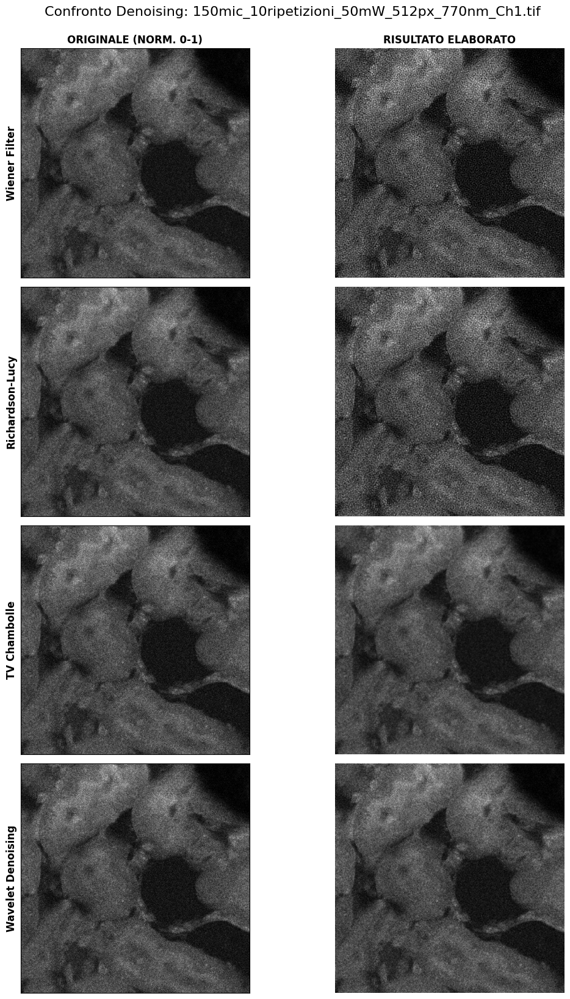

Grafico generato per 150mic_10ripetizioni_50mW_512px_770nm_Ch1.tif.

--- Elaborazione File: 150mic_10ripetizioni_50mW_512px_770nm_Ch2.tif ---


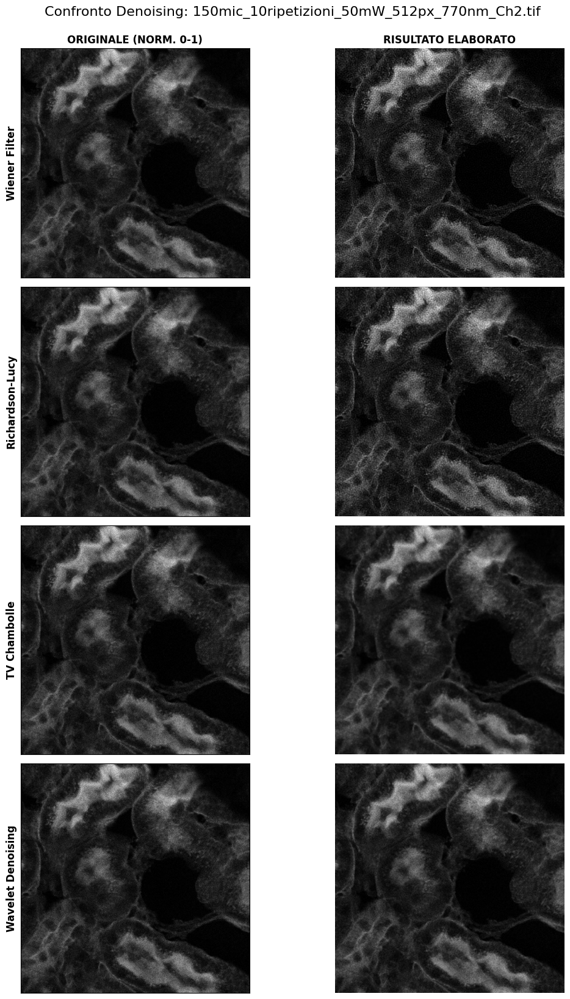

Grafico generato per 150mic_10ripetizioni_50mW_512px_770nm_Ch2.tif.

--- Elaborazione File: 150mic_10ripetizioni_50mW_512px_770nm_Ch3.tif ---


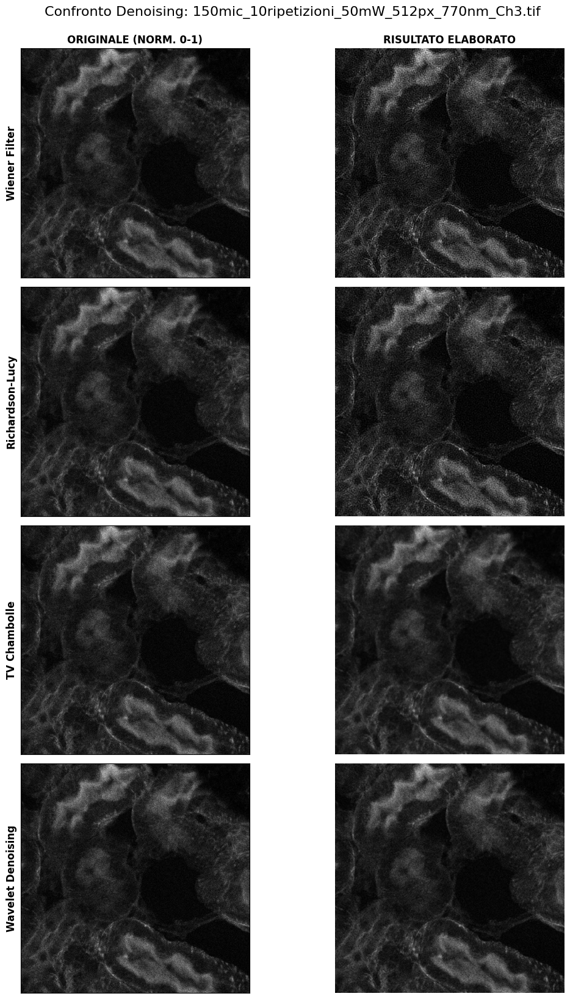

Grafico generato per 150mic_10ripetizioni_50mW_512px_770nm_Ch3.tif.



In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from skimage import io, restoration, img_as_float, color

# --- 1. PREPARAZIONE PSF ---
psf_sigma = 1.1160
psf_size = int(round(1.116 * 6)) # Arrotondato a 7 per avere un centro definito
psf = np.zeros((psf_size, psf_size))
psf[psf_size//2, psf_size//2] = 1
psf = ndimage.gaussian_filter(psf, sigma=psf_sigma)

# --- 2. ELABORAZIONE ---

# Itera direttamente su tutti i percorsi forniti in 'paths'
for idx, filepath in enumerate(paths):
    
    if not os.path.exists(filepath):
        print(f"File non trovato: {filepath}")
        continue

    filename = os.path.basename(filepath)
    print(f"--- Elaborazione File: {filename} ---")
    
    # Caricamento
    img_raw = io.imread(filepath)
    noisy_img = img_as_float(img_raw)

    if noisy_img.ndim == 3:
        noisy_img = color.rgb2gray(noisy_img)

    # --- NORMALIZZAZIONE 0-1 ---
    # Forza i valori nell'intervallo 0-1 basandosi sul min/max dell'immagine caricata
    v_min, v_max = noisy_img.min(), noisy_img.max()
    if v_max > v_min:
        noisy_img = (noisy_img - v_min) / (v_max - v_min)
    else:
        noisy_img = noisy_img - v_min

    # Applicazione Algoritmi
    res_wiener = restoration.wiener(noisy_img, psf, balance=0.01)
    res_rl = restoration.richardson_lucy(noisy_img, psf, num_iter=10, clip=False)
    
    # Wavelet
    sigma_est = restoration.estimate_sigma(noisy_img, average_sigmas=True)
    wavelet_strength = 1.5 
    res_wave = restoration.denoise_wavelet(
        noisy_img, 
        sigma=sigma_est * wavelet_strength, 
        wavelet='coif5', 
        mode='hard', 
        method='BayesShrink', 
        rescale_sigma=True, 
        channel_axis=None
    )
    
    # TV Chambolle
    res_tv = restoration.denoise_tv_chambolle(
        noisy_img, 
        weight=0.03,       
        eps=0.1,        
        max_num_iter=500,  
        channel_axis=None
    )       

    # --- PLOT ---
    algoritmi = [
        ("Wiener Filter", res_wiener),
        ("Richardson-Lucy", res_rl),
        ("TV Chambolle", res_tv),
        ("Wavelet Denoising", res_wave)
    ]

    fig, axes = plt.subplots(4, 2, figsize=(12, 16))
    
    for row, (algo_name, res_img) in enumerate(algoritmi):
        # Originale (Normalizzata)
        axes[row, 0].imshow(noisy_img, cmap='gray', vmin=0, vmax=1)
        if row == 0: axes[row, 0].set_title("ORIGINALE (NORM. 0-1)", fontweight='bold')
        axes[row, 0].set_ylabel(algo_name, fontsize=12, fontweight='bold')
        axes[row, 0].set_xticks([])
        axes[row, 0].set_yticks([])

        # Risultato
        axes[row, 1].imshow(res_img, cmap='gray', vmin=0, vmax=1)
        if row == 0: axes[row, 1].set_title("RISULTATO ELABORATO", fontweight='bold')
        axes[row, 1].axis('off')

    plt.tight_layout()
    plt.suptitle(f"Confronto Denoising: {filename}", fontsize=16, y=1.02)
    plt.show()

    print(f"Grafico generato per {filename}.\n")

## ROI 200X200
si itera ora lo stesso procedimento per uno zoom scelto

Generazione griglia zoom 3x5...
Processing: 150mic_10ripetizioni_50mW_512px_770nm_Ch1.tif
Processing: 150mic_10ripetizioni_50mW_512px_770nm_Ch2.tif
Processing: 150mic_10ripetizioni_50mW_512px_770nm_Ch3.tif


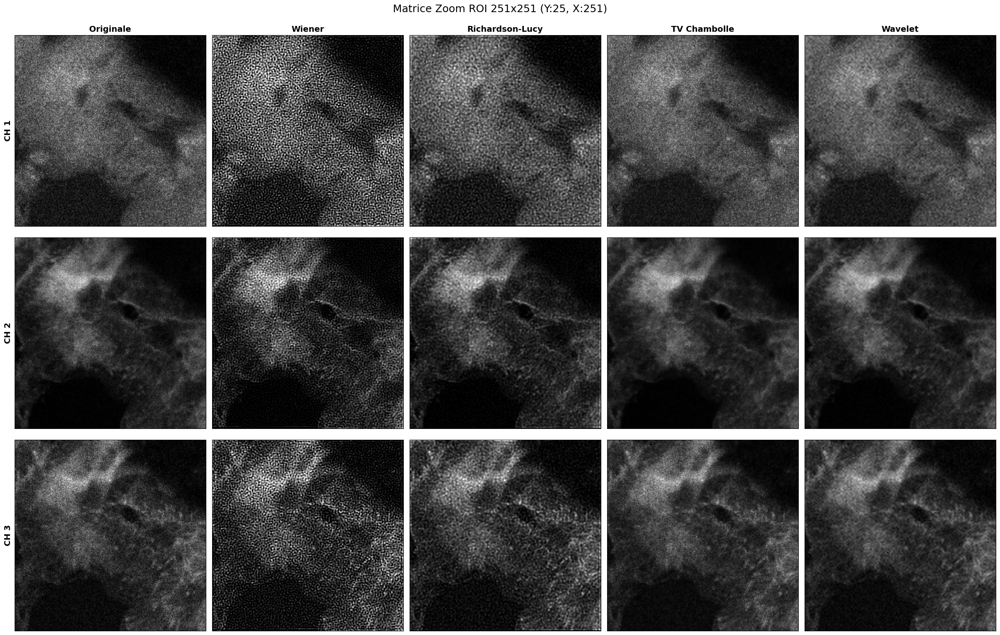

In [18]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from skimage import io, restoration, img_as_float, color

# ================================
# 1. LISTA FILE (modifica qui)
# ================================


base_path = r'/Users/francesco/Repositories /noise_images/Immagini_donoises'

paths = [
    os.path.join(base_path, '150mic_10ripetizioni_50mW_512px_770nm_Ch1.tif'),
    os.path.join(base_path, '150mic_10ripetizioni_50mW_512px_770nm_Ch2.tif'),
    os.path.join(base_path, '150mic_10ripetizioni_50mW_512px_770nm_Ch3.tif')
]


# ================================
# 2. PREPARAZIONE PSF
# ================================
psf_sigma = 1.1160
psf_size = int(round(psf_sigma * 6))
psf = np.zeros((psf_size, psf_size))
psf[psf_size // 2, psf_size // 2] = 1
psf = ndimage.gaussian_filter(psf, sigma=psf_sigma)

# ================================
# 3. COORDINATE ROI
# ================================
r_y, r_x = 25, 251  
roi_size = 251
roi_slice = (slice(r_y, r_y + roi_size), slice(r_x, r_x + roi_size))

# ================================
# 4. SETUP FIGURA
# ================================
fig, axes = plt.subplots(3, 5, figsize=(24, 15))
titles_algo = ["Originale", "Wiener", "Richardson-Lucy", "TV Chambolle", "Wavelet"]

print("Generazione griglia zoom 3x5...")

# ================================
# 5. CICLO PRINCIPALE
# ================================
for row_idx, filepath in enumerate(paths):
    if not os.path.exists(filepath):
        print(f"File mancante: {filepath}")
        continue
        
    filename = os.path.basename(filepath)
    print(f"Processing: {filename}")

    # --- Caricamento immagine ---
    img_full = img_as_float(io.imread(filepath))
    
    if img_full.ndim == 3:
        img_full = color.rgb2gray(img_full)

    # --- ROI ---
    noisy_roi = img_full[roi_slice]

    # --- Normalizzazione ---
    v_min, v_max = noisy_roi.min(), noisy_roi.max()
    if v_max > v_min:
        noisy_roi = (noisy_roi - v_min) / (v_max - v_min)

    # ============================
    # FILTRI
    # ============================

    # Wiener
    res_wiener = restoration.wiener(noisy_roi, psf, balance=0.001)

    # Richardson-Lucy
    res_rl = restoration.richardson_lucy(
        noisy_roi, psf, num_iter=12, clip=False
    )

    # TV Chambolle
    res_tv = restoration.denoise_tv_chambolle(
        noisy_roi, weight=0.01, eps=0.01, max_num_iter=700
    )

    # Wavelet
    sigma_est = restoration.estimate_sigma(noisy_roi, average_sigmas=True)
    res_wave = restoration.denoise_wavelet(
        noisy_roi,
        sigma=sigma_est * 1.5,
        wavelet='coif5',
        mode='hard',
        method='BayesShrink',
        rescale_sigma=True
    )

    # 👉 includiamo originale
    results = [noisy_roi, res_wiener, res_rl, res_tv, res_wave]

    # ============================
    # PLOT
    # ============================
    for col_idx, res_img in enumerate(results):
        ax = axes[row_idx, col_idx]
        ax.imshow(res_img, cmap='gray', vmin=0, vmax=1)

        if row_idx == 0:
            ax.set_title(titles_algo[col_idx], fontsize=14, fontweight='bold')

        if col_idx == 0:
            ax.set_ylabel(f"CH {row_idx + 1}", fontsize=14, fontweight='bold')

        ax.set_xticks([])
        ax.set_yticks([])

# ================================
# 6. OUTPUT
# ================================
plt.tight_layout()
plt.suptitle(f"Matrice Zoom ROI 251x251 (Y:{r_y}, X:{r_x})", fontsize=18, y=1.02)
plt.show()